In [1]:
%matplotlib inline

import pandas as pd
from pathlib import Path
import matplotlib.pyplot as plt
import plotly.express as px
from scipy.stats import linregress
import plotly.graph_objects as go

In [2]:
# Display the data
life_expectancy = Path("Resources/Life_Expectancy_UNData.csv")
life_expectancy_df = pd.read_csv(life_expectancy)
gdp_file = Path("Resources/GDP_Data_MPD.csv")
gdp_file_df = pd.read_csv(gdp_file)
display(life_expectancy_df)
display(gdp_file_df)

/var/folders/q2/v8zk8rk54691thc1c5rrpbjm0000gn/T/ipykernel_4132/261237384.py:3: DtypeWarning: Columns (3,15,16,17,19,21,25,26,27,28,29,33,34,35,36,37,38,39,40,41,42,43,44,45,46,47,49,50,51,52,53,54,55,56,57,58,59,60,61,62,64) have mixed types. Specify dtype option on import or set low_memory=False.
  life_expectancy_df = pd.read_csv(life_expectancy)


,Index,Variant,"Region, subregion, country or area *",Notes,Location code,ISO3 Alpha-code,ISO2 Alpha-code,SDMX code**,Type,Parent code,...,"Male Mortality before Age 60 (deaths under age 60 per 1,000 male live births)","Female Mortality before Age 60 (deaths under age 60 per 1,000 female live births)","Mortality between Age 15 and 50, both sexes (deaths under age 50 per 1,000 alive at age 15)","Male Mortality between Age 15 and 50 (deaths under age 50 per 1,000 males alive at age 15)","Female Mortality between Age 15 and 50 (deaths under age 50 per 1,000 females alive at age 15)","Mortality between Age 15 and 60, both sexes (deaths under age 60 per 1,000 alive at age 15)","Male Mortality between Age 15 and 60 (deaths under age 60 per 1,000 males alive at age 15)","Female Mortality between Age 15 and 60 (deaths under age 60 per 1,000 females alive at age 15)",Net Number of Migrants (thousands),"Net Migration Rate (per 1,000 population)"
0,1,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,581,498,240,272,208,379,430,325,0,0
1,2,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,567,490,231,258,204,368,416,319,0,0
2,3,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,546,477,219,240,197,353,396,310,0,0
3,4,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,536,470,213,233,193,345,386,304,0,0
4,5,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,523,458,206,224,187,335,375,296,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
20591,20592,Estimates,Wallis and Futuna Islands,2.0,876,WLF,WF,876.0,Country/Area,957,...,92,103,31,27,34,83,82,83,- 0,-16.7
20592,20593,Estimates,Wallis and Futuna Islands,2.0,876,WLF,WF,876.0,Country/Area,957,...,99,89,29,29,29,80,89,72,- 0,-14.4
20593,20594,Estimates,Wallis and Futuna Islands,2.0,876,WLF,WF,876.0,Country/Area,957,...,78,80,24,22,26,67,69,64,- 0,-14.5
20594,20595,Estimates,Wallis and Futuna Islands,2.0,876,WLF,WF,876.0,Country/Area,957,...,86,86,27,25,28,73,76,70,- 0,-7.1


,countrycode,country,region,year,gdppc,pop
0,AFG,Afghanistan,South and South East Asia,1,NaN,NaN
1,AFG,Afghanistan,South and South East Asia,730,NaN,NaN
2,AFG,Afghanistan,South and South East Asia,1000,NaN,NaN
3,AFG,Afghanistan,South and South East Asia,1090,NaN,NaN
4,AFG,Afghanistan,South and South East Asia,1150,NaN,NaN
...,...,...,...,...,...,...
131139,ZWE,Zimbabwe,Sub Saharan Africa,2018,1900.0,14097.0
131140,ZWE,Zimbabwe,Sub Saharan Africa,2019,1753.0,14345.0
131141,ZWE,Zimbabwe,Sub Saharan Africa,2020,1586.0,14615.0
131142,ZWE,Zimbabwe,Sub Saharan Africa,2021,1687.0,14900.0


In [3]:
# Clean the data

# Strip whitespace from column titles
life_expectancy_df.columns = life_expectancy_df.columns.str.strip()
gdp_file_df.columns = gdp_file_df.columns.str.strip()

# Rename useful columns before merging
renamed_df = life_expectancy_df.rename(columns={"Region, subregion, country or area *":"country", "Year":"year"})
renamed_df.head()

# Manual mapping dictionary to match names of few countries between both files
country_mapping = {
    "United States": "United States of America",
    "D.P.R. of Korea": "Dem. People's Republic of KoreaUnited States",
    "D.R. of the Congo": "Democratic Republic of the Congo",
    "U.R. of Tanzania: Mainland": "United Republic of Tanzania",
    "Taiwan, Province of China": "China, Taiwan Province of China",
    "TFYR of Macedonia": "North Macedonia"
}
# Standardize country names in gdp file
gdp_file_df['country'] = gdp_file_df['country'].replace(country_mapping)

# Merging Life Expentamcy and GDP file on Country and Year
combined_df = pd.merge(renamed_df, gdp_file_df, on=["country","year"] , how="left") 
combined_df.head(40)

,Index,Variant,country,Notes,Location code,ISO3 Alpha-code,ISO2 Alpha-code,SDMX code**,Type,Parent code,...,"Female Mortality between Age 15 and 50 (deaths under age 50 per 1,000 females alive at age 15)","Mortality between Age 15 and 60, both sexes (deaths under age 60 per 1,000 alive at age 15)","Male Mortality between Age 15 and 60 (deaths under age 60 per 1,000 males alive at age 15)","Female Mortality between Age 15 and 60 (deaths under age 60 per 1,000 females alive at age 15)",Net Number of Migrants (thousands),"Net Migration Rate (per 1,000 population)",countrycode,region,gdppc,pop
0,1,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,208,379,430,325,0,0,NaN,NaN,NaN,NaN
1,2,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,204,368,416,319,0,0,NaN,NaN,NaN,NaN
2,3,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,197,353,396,310,0,0,NaN,NaN,NaN,NaN
3,4,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,193,345,386,304,0,0,NaN,NaN,NaN,NaN
4,5,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,187,335,375,296,0,0,NaN,NaN,NaN,NaN
5,6,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,184,330,370,291,0,0,NaN,NaN,NaN,NaN
6,7,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,180,325,365,285,0,0,NaN,NaN,NaN,NaN
7,8,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,178,323,363,283,0,0,NaN,NaN,NaN,NaN
8,9,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,174,317,356,277,0,0,NaN,NaN,NaN,NaN
9,10,Estimates,WORLD,NaN,900,NaN,NaN,1.0,World,0,...,184,336,378,293,0,0,NaN,NaN,NaN,NaN


In [4]:
# Remove the rows with missing values in GDP Per Capita
cleaned_df = combined_df.dropna(subset=['gdppc'])
cleaned_df

,Index,Variant,country,Notes,Location code,ISO3 Alpha-code,ISO2 Alpha-code,SDMX code**,Type,Parent code,...,"Female Mortality between Age 15 and 50 (deaths under age 50 per 1,000 females alive at age 15)","Mortality between Age 15 and 60, both sexes (deaths under age 60 per 1,000 alive at age 15)","Male Mortality between Age 15 and 60 (deaths under age 60 per 1,000 males alive at age 15)","Female Mortality between Age 15 and 60 (deaths under age 60 per 1,000 females alive at age 15)",Net Number of Migrants (thousands),"Net Migration Rate (per 1,000 population)",countrycode,region,gdppc,pop
1732,1733,Estimates,Burundi,NaN,108,BDI,BI,108.0,Country/Area,910,...,275,424,453,398,- 13,-5.9,BDI,Sub Saharan Africa,595.0,2363.0
1733,1734,Estimates,Burundi,NaN,108,BDI,BI,108.0,Country/Area,910,...,270,421,452,392,- 13,-5.7,BDI,Sub Saharan Africa,618.0,2404.0
1734,1735,Estimates,Burundi,NaN,108,BDI,BI,108.0,Country/Area,910,...,271,420,451,392,- 14,-5.8,BDI,Sub Saharan Africa,626.0,2446.0
1735,1736,Estimates,Burundi,NaN,108,BDI,BI,108.0,Country/Area,910,...,269,418,449,390,- 15,-6.2,BDI,Sub Saharan Africa,641.0,2488.0
1736,1737,Estimates,Burundi,NaN,108,BDI,BI,108.0,Country/Area,910,...,266,416,447,387,- 15,-5.9,BDI,Sub Saharan Africa,665.0,2532.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18863,18864,Estimates,New Zealand,33.0,554,NZL,NZ,554.0,Country/Area,927,...,23,67,82,53,49,10.3,NZL,Western Offshoots,35574.0,4897.0
18864,18865,Estimates,New Zealand,33.0,554,NZL,NZ,554.0,Country/Area,927,...,23,67,81,53,80,16.8,NZL,Western Offshoots,36420.0,4982.0
18865,18866,Estimates,New Zealand,33.0,554,NZL,NZ,554.0,Country/Area,927,...,23,67,81,53,103,21.1,NZL,Western Offshoots,36912.0,5074.0
18866,18867,Estimates,New Zealand,33.0,554,NZL,NZ,554.0,Country/Area,927,...,22,65,79,52,38,7.6,NZL,Western Offshoots,35854.0,5159.0


In [5]:
# Display columns to help in choosing variables of interest
columns_df = pd.DataFrame(cleaned_df.columns)
display(columns_df)

,0
0,Index
1,Variant
2,country
3,Notes
4,Location code
...,...
64,"Net Migration Rate (per 1,000 population)"
65,countrycode
66,region
67,gdppc


In [6]:
# Only copy colums which are needed for the analysis
clean_df = cleaned_df[["country", "Location code", "Type", "year", "Total Population, as of 1 January (thousands)", "Total Population, as of 1 July (thousands)", 
"Life Expectancy at Birth, both sexes (years)", "Male Life Expectancy at Birth (years)", "Female Life Expectancy at Birth (years)", "region",
"gdppc", "pop"]].copy()

# Reset index
clean_df.reset_index(drop=True, inplace=True)

clean_df

,country,Location code,Type,year,"Total Population, as of 1 January (thousands)","Total Population, as of 1 July (thousands)","Life Expectancy at Birth, both sexes (years)",Male Life Expectancy at Birth (years),Female Life Expectancy at Birth (years),region,gdppc,pop
0,Burundi,108,Country/Area,1950.0,2 229,2 254,40.6,39.2,41.9,Sub Saharan Africa,595.0,2363.0
1,Burundi,108,Country/Area,1951.0,2 279,2 303,40.8,39.3,42.2,Sub Saharan Africa,618.0,2404.0
2,Burundi,108,Country/Area,1952.0,2 328,2 352,41.0,39.6,42.4,Sub Saharan Africa,626.0,2446.0
3,Burundi,108,Country/Area,1953.0,2 375,2 399,41.3,39.9,42.6,Sub Saharan Africa,641.0,2488.0
4,Burundi,108,Country/Area,1954.0,2 423,2 447,41.6,40.1,43.0,Sub Saharan Africa,665.0,2532.0
...,...,...,...,...,...,...,...,...,...,...,...,...
11060,New Zealand,554,Country/Area,2017.0,4 707,4 746,82.2,80.4,84.0,Western Offshoots,35574.0,4897.0
11061,New Zealand,554,Country/Area,2018.0,4 785,4 839,82.4,80.5,84.2,Western Offshoots,36420.0,4982.0
11062,New Zealand,554,Country/Area,2019.0,4 892,4 959,82.6,80.7,84.4,Western Offshoots,36912.0,5074.0
11063,New Zealand,554,Country/Area,2020.0,5 026,5 061,82.7,80.9,84.6,Western Offshoots,35854.0,5159.0


In [7]:
#Show Data types to check if data types need to be changed
clean_df.dtypes

country                                           object
Location code                                      int64
Type                                              object
year                                             float64
Total Population, as of 1 January (thousands)     object
Total Population, as of 1 July (thousands)        object
Life Expectancy at Birth, both sexes (years)      object
Male Life Expectancy at Birth (years)             object
Female Life Expectancy at Birth (years)           object
region                                            object
gdppc                                            float64
pop                                              float64
dtype: object

In [8]:
# Modify Datatype as needed
clean_df['year'] = clean_df['year'].astype("int")
clean_df['pop'] = clean_df['pop'].astype("int")
clean_df

,country,Location code,Type,year,"Total Population, as of 1 January (thousands)","Total Population, as of 1 July (thousands)","Life Expectancy at Birth, both sexes (years)",Male Life Expectancy at Birth (years),Female Life Expectancy at Birth (years),region,gdppc,pop
0,Burundi,108,Country/Area,1950,2 229,2 254,40.6,39.2,41.9,Sub Saharan Africa,595.0,2363
1,Burundi,108,Country/Area,1951,2 279,2 303,40.8,39.3,42.2,Sub Saharan Africa,618.0,2404
2,Burundi,108,Country/Area,1952,2 328,2 352,41.0,39.6,42.4,Sub Saharan Africa,626.0,2446
3,Burundi,108,Country/Area,1953,2 375,2 399,41.3,39.9,42.6,Sub Saharan Africa,641.0,2488
4,Burundi,108,Country/Area,1954,2 423,2 447,41.6,40.1,43.0,Sub Saharan Africa,665.0,2532
...,...,...,...,...,...,...,...,...,...,...,...,...
11060,New Zealand,554,Country/Area,2017,4 707,4 746,82.2,80.4,84.0,Western Offshoots,35574.0,4897
11061,New Zealand,554,Country/Area,2018,4 785,4 839,82.4,80.5,84.2,Western Offshoots,36420.0,4982
11062,New Zealand,554,Country/Area,2019,4 892,4 959,82.6,80.7,84.4,Western Offshoots,36912.0,5074
11063,New Zealand,554,Country/Area,2020,5 026,5 061,82.7,80.9,84.6,Western Offshoots,35854.0,5159


In [9]:

# Rename columns for convenience
selected_df = clean_df.rename(columns={"country":"Country", 
                                    "Life Expectancy at Birth, both sexes (years)":"Life Expectancy",
                                    "gdppc":"GDP per Capita",
                                    "region":"Region",
                                    "Total Population, as of 1 July (thousands)":"Population"                                
                                   })
selected_df


,Country,Location code,Type,year,"Total Population, as of 1 January (thousands)",Population,Life Expectancy,Male Life Expectancy at Birth (years),Female Life Expectancy at Birth (years),Region,GDP per Capita,pop
0,Burundi,108,Country/Area,1950,2 229,2 254,40.6,39.2,41.9,Sub Saharan Africa,595.0,2363
1,Burundi,108,Country/Area,1951,2 279,2 303,40.8,39.3,42.2,Sub Saharan Africa,618.0,2404
2,Burundi,108,Country/Area,1952,2 328,2 352,41.0,39.6,42.4,Sub Saharan Africa,626.0,2446
3,Burundi,108,Country/Area,1953,2 375,2 399,41.3,39.9,42.6,Sub Saharan Africa,641.0,2488
4,Burundi,108,Country/Area,1954,2 423,2 447,41.6,40.1,43.0,Sub Saharan Africa,665.0,2532
...,...,...,...,...,...,...,...,...,...,...,...,...
11060,New Zealand,554,Country/Area,2017,4 707,4 746,82.2,80.4,84.0,Western Offshoots,35574.0,4897
11061,New Zealand,554,Country/Area,2018,4 785,4 839,82.4,80.5,84.2,Western Offshoots,36420.0,4982
11062,New Zealand,554,Country/Area,2019,4 892,4 959,82.6,80.7,84.4,Western Offshoots,36912.0,5074
11063,New Zealand,554,Country/Area,2020,5 026,5 061,82.7,80.9,84.6,Western Offshoots,35854.0,5159


In [10]:
# Extract necessary columns

final_df = selected_df[['Country', 'year', 'Life Expectancy', 'GDP per Capita', 'Region', 'Population']]
final_df.head()

,Country,year,Life Expectancy,GDP per Capita,Region,Population
0,Burundi,1950,40.6,595.0,Sub Saharan Africa,2 254
1,Burundi,1951,40.8,618.0,Sub Saharan Africa,2 303
2,Burundi,1952,41.0,626.0,Sub Saharan Africa,2 352
3,Burundi,1953,41.3,641.0,Sub Saharan Africa,2 399
4,Burundi,1954,41.6,665.0,Sub Saharan Africa,2 447


In [11]:
#Remove extra space from Population and convert Life Expectancy into a float
#final_df['Population'] = final_df['Population'].str.replace(' ', '').str.replace(',', '').astype(float)
final_df['Population'] = final_df['Population'].str.replace(' ', '').astype(float)
final_df['Life Expectancy'] = final_df['Life Expectancy'].astype(float)
final_df

/var/folders/q2/v8zk8rk54691thc1c5rrpbjm0000gn/T/ipykernel_4132/652345182.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['Population'] = final_df['Population'].str.replace(' ', '').astype(float)
/var/folders/q2/v8zk8rk54691thc1c5rrpbjm0000gn/T/ipykernel_4132/652345182.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  final_df['Life Expectancy'] = final_df['Life Expectancy'].astype(float)


,Country,year,Life Expectancy,GDP per Capita,Region,Population
0,Burundi,1950,40.6,595.0,Sub Saharan Africa,2254.0
1,Burundi,1951,40.8,618.0,Sub Saharan Africa,2303.0
2,Burundi,1952,41.0,626.0,Sub Saharan Africa,2352.0
3,Burundi,1953,41.3,641.0,Sub Saharan Africa,2399.0
4,Burundi,1954,41.6,665.0,Sub Saharan Africa,2447.0
...,...,...,...,...,...,...
11060,New Zealand,2017,82.2,35574.0,Western Offshoots,4746.0
11061,New Zealand,2018,82.4,36420.0,Western Offshoots,4839.0
11062,New Zealand,2019,82.6,36912.0,Western Offshoots,4959.0
11063,New Zealand,2020,82.7,35854.0,Western Offshoots,5061.0


In [12]:
# Specify the file path where you want to save the CSV file
csv_file_path = 'Output/final_data.csv'

# Write final_df to CSV
final_df.to_csv(csv_file_path, index=False)

print(f"DataFrame successfully written to {csv_file_path}")

DataFrame successfully written to Output/final_data.csv


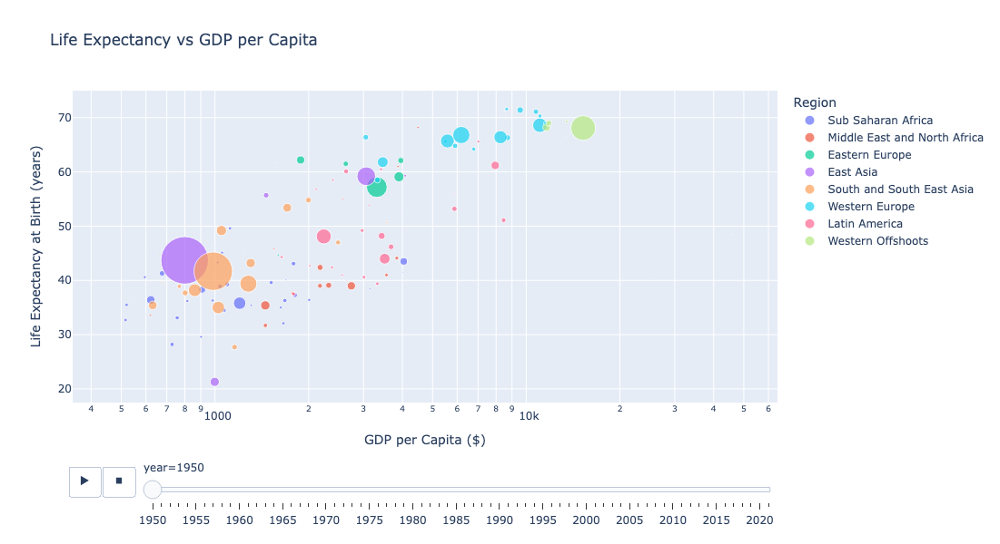

In [13]:
# Create the scatter plot for Life Expectancy vs GDP per Capita 
fig = px.scatter(
    final_df,
    x='GDP per Capita',
    y='Life Expectancy',
    size='Population',
    color='Region',
    animation_frame='year',
    hover_name='Country',
    log_x=True,
    size_max=60,
    title='Life Expectancy vs GDP per Capita',
    labels={
        'Life Expectancy': 'Life Expectancy at Birth (years)',
        'GDP per Capita': 'GDP per Capita ($)',
        'Population': 'Population (thousands)'
    }
)
# Update the layout to set the size
fig.update_layout(
    width=1000,  # Set the width to 1000 pixels
    height=600   # Set the height to 600 pixels
)

# Save the figure as an HTML file
fig.write_html("Output/Fig1.html")

# Show the plot
fig.show()

In [14]:
# Get the data just for the year 2021 to show how life expectancy compares between wealthy and poor countries
data2021_df = final_df[final_df['year'] == 2021]

# Sorting and selecting top 10 and bottom 10 countries by GDP per capita
top_5_gdp = data2021_df.nlargest(10, 'GDP per Capita')
bottom_5_gdp = data2021_df.nsmallest(10, 'GDP per Capita')

# Combining the top 5 and bottom 5 into a single DataFrame
gdp_df = pd.concat([top_5_gdp, bottom_5_gdp])
gdp_df

,Country,year,Life Expectancy,GDP per Capita,Region,Population
6031,Qatar,2021,79.3,143469.0,Middle East and North Africa,2688.0
7404,Norway,2021,83.2,86335.0,Western Europe,5403.0
5110,Singapore,2021,82.8,77945.0,South and South East Asia,5941.0
6317,United Arab Emirates,2021,78.7,72460.0,Middle East and North Africa,9365.0
5815,Kuwait,2021,78.7,66418.0,Middle East and North Africa,4250.0
8904,Switzerland,2021,84.0,62595.0,Western Europe,8691.0
10920,United States of America,2021,77.2,57523.0,Western Offshoots,336998.0
7246,Ireland,2021,82.0,57278.0,Western Europe,4987.0
8760,Luxembourg,2021,82.6,55347.0,Western Europe,639.0
3958,"China, Taiwan Province of China",2021,81.0,51944.0,East Asia,23860.0


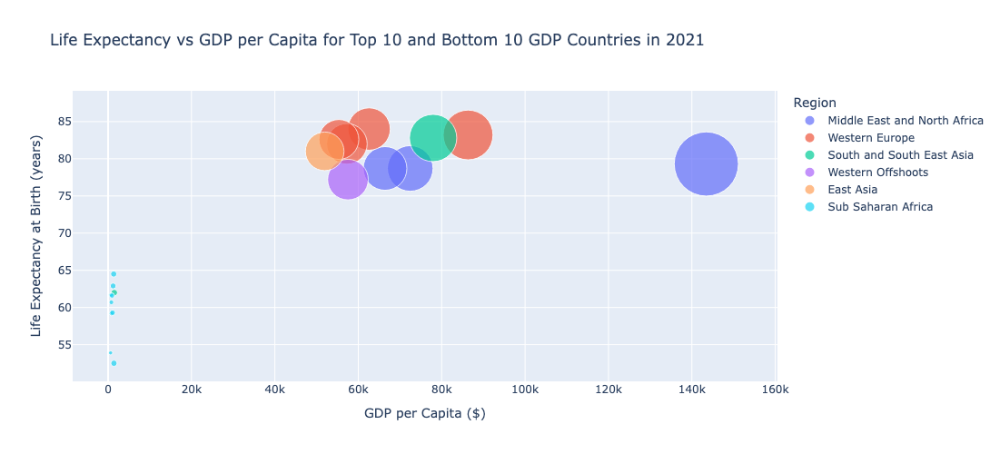

In [15]:
# Create the scatter plot for year 2021 to show how life expectancy compares between wealthy and poor countries

fig = px.scatter(
    gdp_df,
    x='GDP per Capita',
    y='Life Expectancy',
    color='Region',
    #size='Population',
    size='GDP per Capita',
    hover_name='Country',
    title='Life Expectancy vs GDP per Capita for Top 10 and Bottom 10 GDP Countries in 2021',
    labels={'GDP per Capita': 'GDP per Capita ($)', 'Life Expectancy': 'Life Expectancy at Birth (years)'},
    size_max=50
)
# Update the layout to set the size
fig.update_layout(
    width=1000,  # Set the width to 1000 pixels
    height=500   # Set the height to 500 pixels
)

# Save the figure as an HTML file
fig.write_html("Output/Fig2.html")

# Show the plot
fig.show()

The correlation between GDP per Capita and Life Expectancy is 0.7
The r-squared value is: 0.49480849856301284


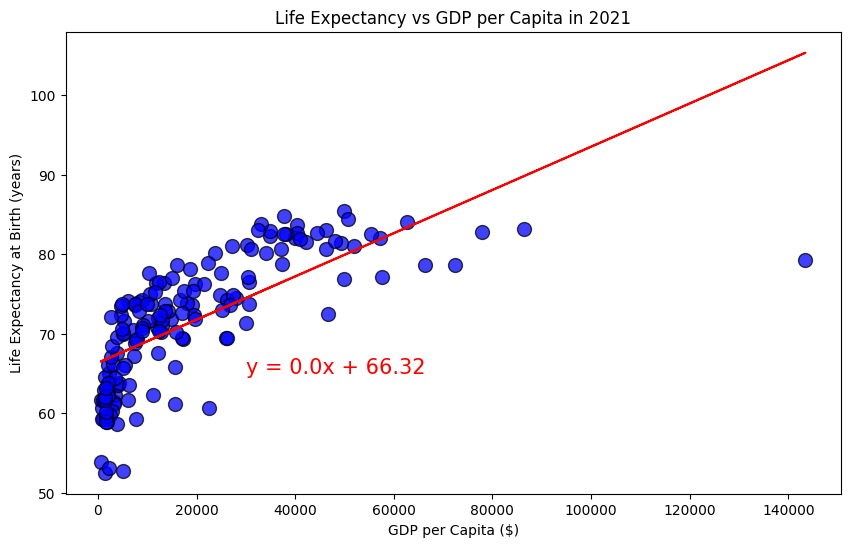

In [16]:
# Calculate the correlation coefficient and a linear regression model 
# for GDP Per Capita and Life Expectancy for the year 2021
x_values = data2021_df['GDP per Capita']
y_values = data2021_df['Life Expectancy']
(slope, intercept, rvalue, pvalue, stderr) = linregress(x_values, y_values)
regress_values = x_values * slope + intercept
line_eq = "y = " + str(round(slope,2)) + "x + " + str(round(intercept,2))
plt.figure(figsize=(10, 6))
plt.scatter(x_values, y_values, marker='o', facecolors='blue', edgecolors='black', s=100, alpha=0.75)
plt.plot(x_values,regress_values,"r-")
plt.title('Life Expectancy vs GDP per Capita in 2021')
plt.annotate(line_eq,(30000,65),fontsize=15,color="red")
plt.xlabel('GDP per Capita ($)')
plt.ylabel('Life Expectancy at Birth (years)')
print(f'The correlation between GDP per Capita and Life Expectancy is {round(rvalue, 2)}')
print(f"The r-squared value is: {rvalue**2}")
# Save the figure
plt.savefig("Output/Fig3.png")
#Show the plot
plt.show()

/var/folders/q2/v8zk8rk54691thc1c5rrpbjm0000gn/T/ipykernel_4132/1039384745.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



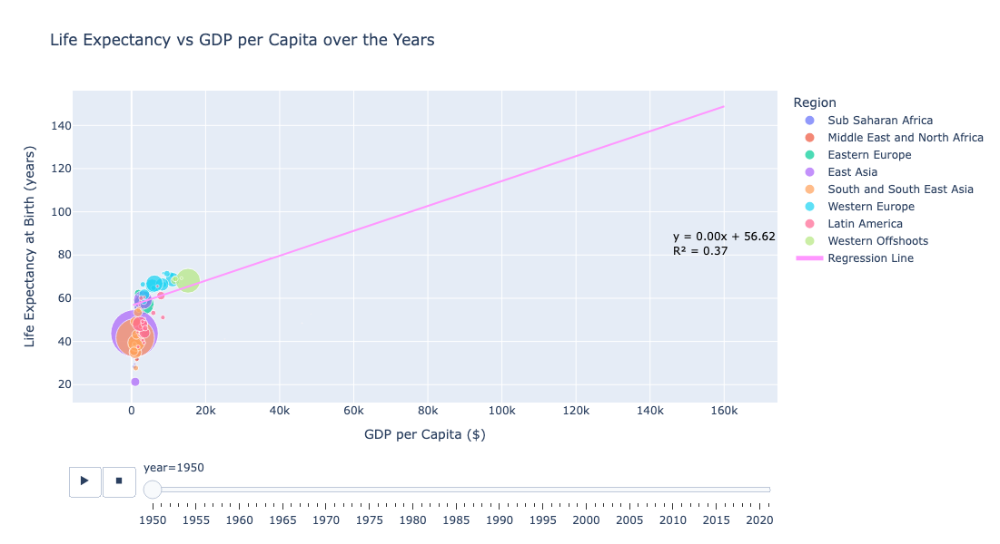

In [17]:
# Calculate linear regression for all years 
slope, intercept, r_value, p_value, std_err = linregress(final_df['GDP per Capita'], final_df['Life Expectancy'])

# Create regression line
final_df['Regression Line'] = slope * final_df['GDP per Capita'] + intercept

# Create the scatter plot with regression line
fig = px.scatter(
    final_df,
    x='GDP per Capita',
    y='Life Expectancy',
    animation_frame='year',
    animation_group='Country',
    color='Region',
    size='Population',
    hover_name='Country',
    title='Life Expectancy vs GDP per Capita over the Years',
    labels={'GDP per Capita': 'GDP per Capita ($)', 'Life Expectancy': 'Life Expectancy at Birth (years)'},
    size_max=60
)

# Add regression line to the plot
fig.add_trace(
    go.Scatter(
        x=final_df['GDP per Capita'],
        y=final_df['Regression Line'],
        mode='lines',
        name='Regression Line'
    )
)

# Add annotation for the regression line equation and r-value
equation = f'y = {slope:.2f}x + {intercept:.2f}'
r_squared = f'R² = {r_value**2:.2f}'
fig.add_annotation(
    x=final_df['GDP per Capita'].max(),
    y=final_df['Life Expectancy'].max(),
    text=f'{equation}<br>{r_squared}',
    showarrow=False,
    font=dict(size=12, color='black'),
    align='left'
)
# Update the layout to set the size
fig.update_layout(
    width=1000,  # Set the width to 1000 pixels
    height=600   # Set the height to 600 pixels
)

# Save the figure as an HTML file
fig.write_html("Output/Fig4.html")

# Show the plot
fig.show()

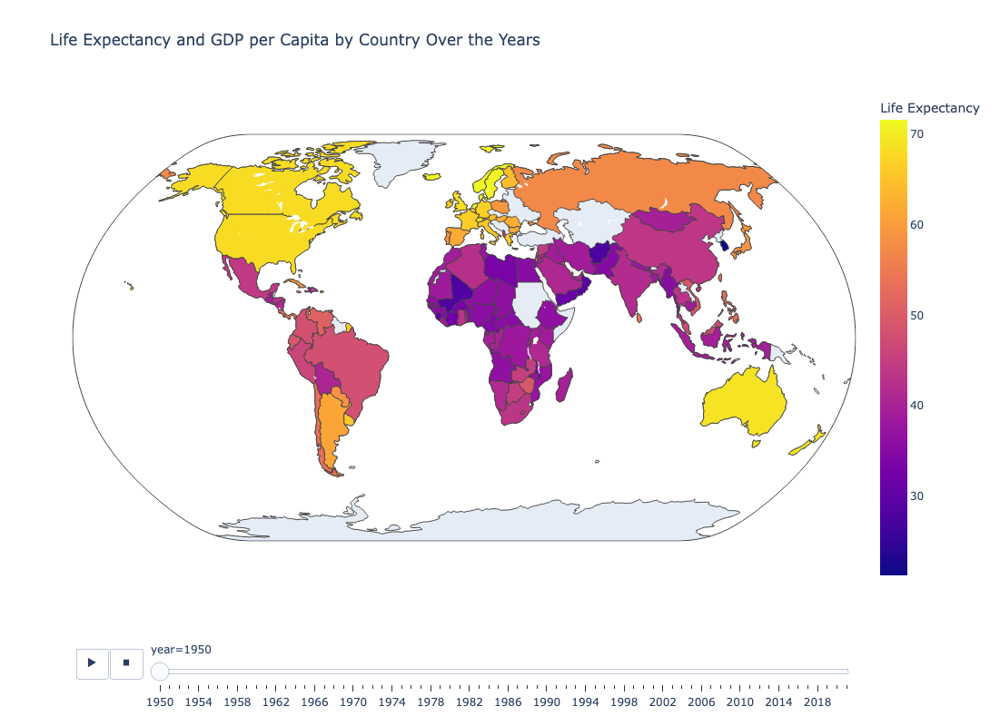

In [18]:
# Create the choropleth map to show Life Expectancy and GDP per Capita by Country Over the Years
fig = px.choropleth(
    final_df,
    locations='Country',
    locationmode='country names',
    color='Life Expectancy',
  #  color='GDP per Capita',
    hover_name='Country',
    hover_data={
        'Life Expectancy': True,
        'GDP per Capita': True,
        'year': True,
        'Population': True,
        'Country': False  # To avoid redundancy as hover_name already includes it
    },
    animation_frame='year',
    projection='natural earth',
    title='Life Expectancy and GDP per Capita by Country Over the Years',
    color_continuous_scale=px.colors.sequential.Plasma
)

# Update the layout to set the size
fig.update_layout(
    width=1100,  # Set the width to 1000 pixels
    height=800   # Set the height to 800 pixels
)
# Save the figure as an HTML file
fig.write_html("Output/Fig5.html")

# Show the plot
fig.show()